# astroPT Multimodal Embeddings Analysis

This notebook analyzes embeddings extracted from the **astroPT multimodal model**.

astroPT is a transformer model trained on both DESI spectra and Euclid images. This analysis uses the multimodal checkpoint that combines spectral and imaging information.

We use UMAP dimensionality reduction to visualize the high-dimensional embeddings and analyze:
- How embeddings correlate with physical galaxy properties
- Spectral type separation (GALAXY, QSO, STAR)
- The model's learned representation of multimodal astronomical data

**Model checkpoint**: `/pbs/home/a/astroinfo09/logs/logs/astropt_multimodal_full_20251106_011934/ckpt_iter_21000.pt`  
**Embeddings**: `/pbs/home/a/astroinfo09/logs/logs/astropt_multimodal_full_20251106_011934/embeddings_output_21000/`

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from astropy.io import fits
from astropy.table import Table
import umap
import time
from scipy.stats import spearmanr

# Configure matplotlib
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

## 1. Load astroPT Embeddings

Load the embeddings extracted from the multimodal astroPT model.

In [2]:
# Path to astroPT multimodal embeddings
embeddings_dir = Path("/pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/astropt/embeddings_output_21000")

print("Loading astroPT multimodal embeddings...")
print(f"Embeddings directory: {embeddings_dir}")

# Check directory contents
if embeddings_dir.exists():
    files = list(embeddings_dir.glob("*.npy")) + list(embeddings_dir.glob("*.npz"))
    print(f"\nFound {len(files)} files:")
    for f in files[:10]:  # Show first 10 files
        print(f"  {f.name}")
    if len(files) > 10:
        print(f"  ... and {len(files) - 10} more")
else:
    print(f"⚠ WARNING: Directory not found: {embeddings_dir}")

# Try to load embeddings (adapt based on actual file structure)
# Common patterns:
# - embeddings.npy, targetids.npy, redshifts.npy
# - embeddings_with_metadata.npz
# - batch_*.npy files

try:
    # Try loading the multimodal training files
    embeddings = np.load(embeddings_dir / "multimodal_train_embeddings.npy")
    target_ids = np.load(embeddings_dir / "multimodal_train_target_ids.npy")
    object_ids = np.load(embeddings_dir / "multimodal_train_object_ids.npy")
    redshifts = np.load(embeddings_dir / "multimodal_train_redshifts.npy")
    has_image = np.load(embeddings_dir / "multimodal_train_has_image.npy")
    has_spectrum = np.load(embeddings_dir / "multimodal_train_has_spectrum.npy")
    
    print(f"\n✓ Embeddings loaded: {embeddings.shape}")
    print(f"✓ Target IDs: {len(target_ids)}")
    print(f"✓ Object IDs: {len(object_ids)}")
    print(f"✓ Redshifts: {len(redshifts)}")
    print(f"  Redshift range: [{redshifts.min():.3f}, {redshifts.max():.3f}]")
    print(f"\n✓ Data availability:")
    print(f"  Has spectrum: {has_spectrum.sum()} ({100*has_spectrum.sum()/len(has_spectrum):.1f}%)")
    print(f"  Has image: {has_image.sum()} ({100*has_image.sum()/len(has_image):.1f}%)")
    print(f"  Has both: {(has_spectrum & has_image).sum()} ({100*(has_spectrum & has_image).sum()/len(has_spectrum):.1f}%)")

except FileNotFoundError as e:
    print(f"\n❌ Could not find embeddings files.")
    print(f"Error: {e}")
    print("\nPlease check the directory structure.")
    raise

Loading astroPT multimodal embeddings...
Embeddings directory: /pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/astropt/embeddings_output_21000

Found 8 files:
  multimodal_train_object_ids.npy
  multimodal_train_embeddings.npy
  multimodal_train_redshifts.npy
  multimodal_train_has_image.npy
  embeddings_2d_pca.npy
  multimodal_train_target_ids.npy
  embeddings_10d_pca.npy
  multimodal_train_has_spectrum.npy

✓ Embeddings loaded: (12210, 768)
✓ Target IDs: 12210
✓ Object IDs: 12210
✓ Redshifts: 12210
  Redshift range: [0.009, 1.797]

✓ Data availability:
  Has spectrum: 12210 (100.0%)
  Has image: 12210 (100.0%)
  Has both: 12210 (100.0%)


## 2. Load Catalog and Match Objects

Load the DESI-Euclid catalog to get physical properties for each object.

In [3]:
# Path to the combined DESI-Euclid catalog
catalog_path = "/pbs/throng/training/astroinfo2025/data/astroPT_euclid_desi_dataset/desi_euclid_catalog.fits"

print("Loading catalog...")
with fits.open(catalog_path) as hdul:
    catalog = Table(hdul[1].data)

print(f"✓ Catalog loaded: {len(catalog)} entries")
print(f"✓ Available columns ({len(catalog.colnames)}):")
for i, col in enumerate(catalog.colnames[:20]):  # Show first 20 columns
    print(f"  {col}")
if len(catalog.colnames) > 20:
    print(f"  ... and {len(catalog.colnames) - 20} more")

Loading catalog...
✓ Catalog loaded: 15999 entries
✓ Available columns (309):
  object_id
  right_ascension
  declination
  segmentation_area
  flux_h_sersic
  flux_vis_sersic
  ellipticity
  kron_radius
  segmentation_map_id
  VIS_name
  flux_detection_total
  flux_vis_4fwhm_aper
  flux_vis_3fwhm_aper
  flux_vis_2fwhm_aper
  flux_vis_1fwhm_aper
  spurious_flag
  det_quality_flag
  mumax_minus_mag
  smooth_or_featured_smooth
  smooth_or_featured_featured_or_disk
  ... and 289 more


In [4]:
# Find ID column in catalog and determine which embedding IDs to use
id_column = None
embedding_ids_to_match = None

# Try TARGETID first (DESI spectroscopic ID)
if 'TARGETID' in catalog.colnames:
    id_column = 'TARGETID'
    embedding_ids_to_match = target_ids
    print(f"Using catalog ID column: {id_column} (matching with target_ids)")
# Try object_id (Euclid ID)
elif 'object_id' in catalog.colnames:
    id_column = 'object_id'
    embedding_ids_to_match = object_ids
    print(f"Using catalog ID column: {id_column} (matching with object_ids)")
else:
    print("⚠ WARNING: Could not find standard ID column in catalog")
    print("Available columns:", catalog.colnames[:10])

if id_column is not None:
    # Create mapping from object ID to catalog index
    catalog_ids = np.array(catalog[id_column], dtype=np.int64)
    id_to_idx = {int(cid): i for i, cid in enumerate(catalog_ids)}
    
    print(f"\nCatalog ID mapping created: {len(id_to_idx)} unique IDs")
    
    # Convert embedding IDs to int64 for matching
    embedding_ids_int = embedding_ids_to_match.astype(np.int64)
    
    # Match embeddings to catalog
    matched_indices = []
    unmatched_count = 0
    
    for eid in embedding_ids_int:
        if eid in id_to_idx:
            matched_indices.append(id_to_idx[eid])
        else:
            matched_indices.append(-1)
            unmatched_count += 1
    
    matched_indices = np.array(matched_indices)
    match_rate = (len(matched_indices) - unmatched_count) / len(embedding_ids_int) * 100
    
    print(f"\n{'='*60}")
    print(f"MATCHING RESULTS")
    print(f"{'='*60}")
    print(f"✓ Matched: {len(matched_indices) - unmatched_count}/{len(embedding_ids_int)} ({match_rate:.1f}%)")
    
    if unmatched_count > 0:
        print(f"⚠ Unmatched: {unmatched_count} ({100-match_rate:.1f}%)")
    print(f"{'='*60}")

Using catalog ID column: TARGETID (matching with target_ids)

Catalog ID mapping created: 15263 unique IDs

MATCHING RESULTS
✓ Matched: 12210/12210 (100.0%)


## 3. Extract Physical Properties from Catalog

In [5]:
# Extract physical properties from catalog
def safe_extract(column_name):
    """Extract column values, filling unmatched entries with NaN"""
    if column_name not in catalog.colnames:
        print(f"⚠ Column '{column_name}' not found in catalog")
        return np.full(len(matched_indices), np.nan, dtype=float)
    
    values = np.full(len(matched_indices), np.nan, dtype=float)
    mask = matched_indices >= 0
    values[mask] = catalog[column_name][matched_indices[mask]]
    return values

def safe_extract_string(column_name):
    """Extract string column values, filling unmatched entries with empty string"""
    if column_name not in catalog.colnames:
        print(f"⚠ Column '{column_name}' not found in catalog")
        return np.full(len(matched_indices), '', dtype=object)
    
    values = np.full(len(matched_indices), '', dtype=object)
    mask = matched_indices >= 0
    values[mask] = [s.strip() if isinstance(s, (str, bytes)) else str(s) for s in catalog[column_name][matched_indices[mask]]]
    return values

print("Extracting physical properties from catalog...\n")

# Key physical properties
if redshifts is None:
    # If redshifts weren't in the embeddings, get them from catalog
    redshifts = safe_extract('Z')
    if np.all(np.isnan(redshifts)):
        redshifts = safe_extract('REDSHIFT')

logm = safe_extract('LOGM')              # Stellar mass
logsfr = safe_extract('LOGSFR')          # Star formation rate
dn4000 = safe_extract('DN4000')          # 4000Å break
gr_color = safe_extract('GR')            # g-r color
spectype = safe_extract_string('SPECTYPE')  # Spectral type

# Derived properties
ssfr = logsfr - logm  # Specific SFR

# Image/morphological properties from Euclid
ellipticity = safe_extract('ellipticity')                        # Ellipticity
kron_radius = safe_extract('kron_radius')                        # Kron radius (size)
concentration = safe_extract('concentration')                     # Concentration index
asymmetry = safe_extract('asymmetry')                            # Asymmetry
smoothness = safe_extract('smoothness')                          # Smoothness/clumpiness
gini = safe_extract('gini')                                      # Gini coefficient
sersic_index = safe_extract('sersic_sersic_vis_index')          # Sérsic index
sersic_radius = safe_extract('sersic_sersic_vis_radius')        # Sérsic radius
axis_ratio = safe_extract('sersic_sersic_vis_axis_ratio')       # Axis ratio

# Additional morphological features
has_spiral_arms = safe_extract('has_spiral_arms_yes')           # Spiral arms presence
disk_edge_on = safe_extract('disk_edge_on_yes')                 # Edge-on disk
det_quality_flag = safe_extract('det_quality_flag')             # Detection quality flag

# Emission line properties
halpha_flux = safe_extract('HALPHA_FLUX')
hbeta_flux = safe_extract('HBETA_FLUX')
# Compute Hα/Hβ ratio (Balmer decrement)
# Valid ratio should be > 2.86 (intrinsic), lower indicates dust attenuation
halpha_hbeta_ratio = np.full(len(halpha_flux), np.nan)
valid_mask = (hbeta_flux > 0) & (halpha_flux > 0)
halpha_hbeta_ratio[valid_mask] = halpha_flux[valid_mask] / hbeta_flux[valid_mask]

# Signal-to-Noise Ratios
snr_b = safe_extract('SNR_B')                                   # SNR in B band
snr_r = safe_extract('SNR_R')                                   # SNR in R band
snr_z = safe_extract('SNR_Z')                                   # SNR in Z band

# Print statistics
print("✓ Spectral/Physical property statistics:")
spectral_properties = {
    'Redshift': redshifts,
    'LOGM (stellar mass)': logm,
    'LOGSFR': logsfr,
    'sSFR (log)': ssfr,
    'DN4000': dn4000,
    'g-r color': gr_color
}

for name, values in spectral_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Morphological property statistics:")
morphological_properties = {
    'Ellipticity': ellipticity,
    'Kron radius': kron_radius,
    'Concentration': concentration,
    'Asymmetry': asymmetry,
    'Smoothness': smoothness,
    'Gini': gini,
    'Sérsic index': sersic_index,
    'Sérsic radius': sersic_radius,
    'Axis ratio': axis_ratio,
    'Has spiral arms': has_spiral_arms,
    'Disk edge-on': disk_edge_on,
    'Detection quality': det_quality_flag
}

for name, values in morphological_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Emission line property statistics:")
emission_properties = {
    'Hα/Hβ ratio': halpha_hbeta_ratio,
}

for name, values in emission_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

print("\n✓ Signal-to-Noise Ratio statistics:")
snr_properties = {
    'SNR B-band': snr_b,
    'SNR R-band': snr_r,
    'SNR Z-band': snr_z,
}

for name, values in snr_properties.items():
    valid = ~np.isnan(values)
    if valid.sum() > 0:
        print(f"  {name}: {np.nanmean(values):.2f} ± {np.nanstd(values):.2f} (n={valid.sum()})")
    else:
        print(f"  {name}: No valid data")

# Spectral types
unique_spectypes = np.unique(spectype[spectype != ''])
if len(unique_spectypes) > 0:
    print(f"\n✓ Spectral types found: {list(unique_spectypes)}")
    for stype in unique_spectypes:
        count = (spectype == stype).sum()
        print(f"  {stype}: {count:,} ({100*count/len(spectype):.1f}%)")

Extracting physical properties from catalog...

✓ Spectral/Physical property statistics:
  Redshift: 0.37 ± 0.24 (n=12210)
  LOGM (stellar mass): 9.70 ± 2.60 (n=12108)
  LOGSFR: -2.02 ± 4.39 (n=12108)
  sSFR (log): -11.71 ± 5.63 (n=12108)
  DN4000: 1.54 ± 0.48 (n=12210)
  g-r color: 0.50 ± 0.19 (n=12108)

✓ Morphological property statistics:
  Ellipticity: 0.34 ± 0.19 (n=12210)
  Kron radius: 88.36 ± 52.64 (n=12210)
  Concentration: 3.48 ± 0.69 (n=12210)
  Asymmetry: 0.29 ± 0.15 (n=12210)
  Smoothness: 0.22 ± 0.08 (n=12210)
  Gini: 0.66 ± 0.09 (n=12210)
  Sérsic index: 2.30 ± 1.65 (n=12210)
  Sérsic radius: 1.68 ± 2.67 (n=12210)
  Axis ratio: 0.64 ± 0.21 (n=12210)
  Has spiral arms: 43.25 ± 34.90 (n=10812)
  Disk edge-on: 14.29 ± 23.85 (n=10812)
  Detection quality: 23.47 ± 99.70 (n=12210)

✓ Emission line property statistics:
  Hα/Hβ ratio: 818360.88 ± 44014992.72 (n=7798)

✓ Signal-to-Noise Ratio statistics:
  SNR B-band: 0.97 ± 0.94 (n=12210)
  SNR R-band: 3.01 ± 2.00 (n=12210)
  SN

## 4. UMAP Dimensionality Reduction

Apply UMAP to reduce the embeddings to 2D for visualization.

In [6]:
print("Running UMAP dimensionality reduction...")
print("This may take a few minutes...")

# Configure UMAP
umap_model = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='cosine',
    random_state=42
)

# Fit and transform
start_time = time.time()
embeddings_umap = umap_model.fit_transform(embeddings)
elapsed = time.time() - start_time

print(f"✓ UMAP completed in {elapsed:.2f} seconds")
print(f"UMAP embeddings shape: {embeddings_umap.shape}")

Running UMAP dimensionality reduction...
This may take a few minutes...


/pbs/throng/training/astroinfo2025/env/astroPT/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✓ UMAP completed in 18.81 seconds
UMAP embeddings shape: (12210, 2)


## 5. Visualize UMAP - Redshift

Plot the 2D UMAP projection colored by redshift.

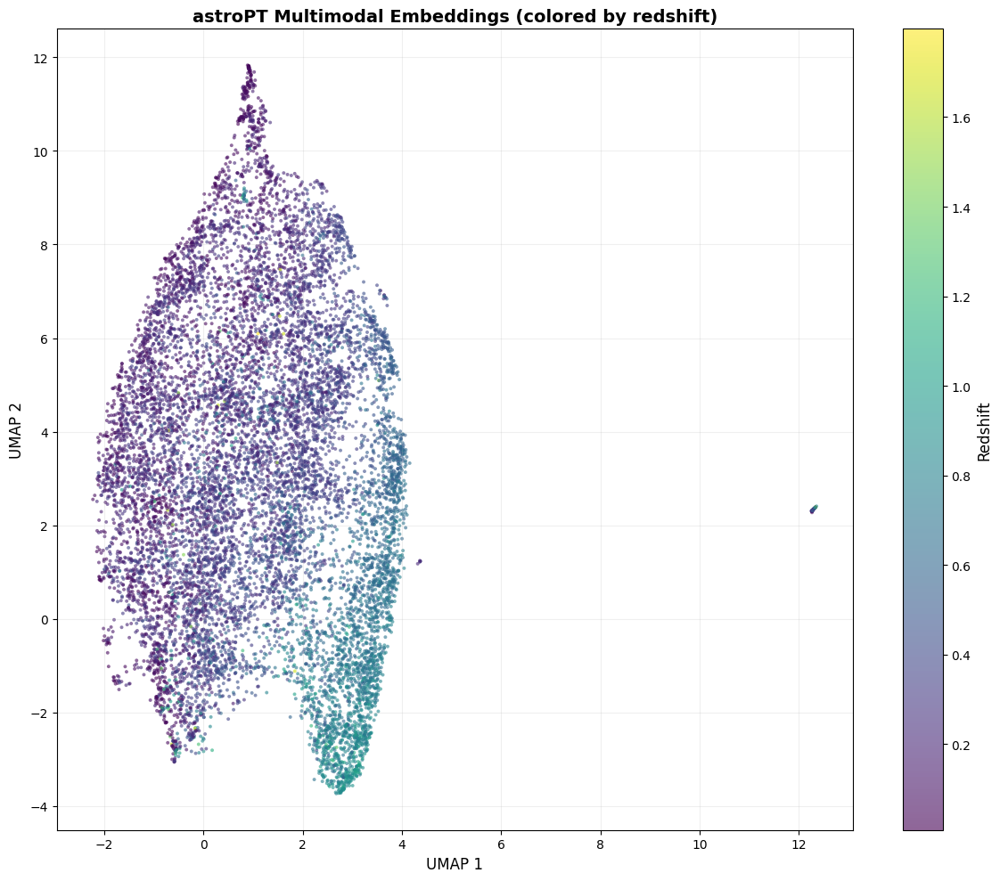

Saved: astropt_embeddings_redshift.png


In [7]:
fig, ax = plt.subplots(figsize=(12, 10))

valid_z = ~np.isnan(redshifts)

if valid_z.sum() > 0:
    # Plot valid redshifts
    scatter = ax.scatter(
        embeddings_umap[valid_z, 0],
        embeddings_umap[valid_z, 1],
        c=redshifts[valid_z],
        cmap='viridis',
        s=8,
        alpha=0.6,
        edgecolors='none'
    )
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Redshift', fontsize=12)
    
    # Plot invalid redshifts in gray
    if (~valid_z).sum() > 0:
        ax.scatter(
            embeddings_umap[~valid_z, 0],
            embeddings_umap[~valid_z, 1],
            s=5,
            color='lightgray',
            alpha=0.3,
            edgecolors='none'
        )
else:
    ax.scatter(embeddings_umap[:, 0], embeddings_umap[:, 1], s=8, alpha=0.6)

ax.set_xlabel('UMAP 1', fontsize=12)
ax.set_ylabel('UMAP 2', fontsize=12)
ax.set_title('astroPT Multimodal Embeddings (colored by redshift)', fontsize=14, fontweight='bold')
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('astropt_embeddings_redshift.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: astropt_embeddings_redshift.png")

## 6. Visualize by Physical Properties

Create visualizations colored by different physical properties.


SPECTRAL/PHYSICAL PROPERTIES VISUALIZATIONS



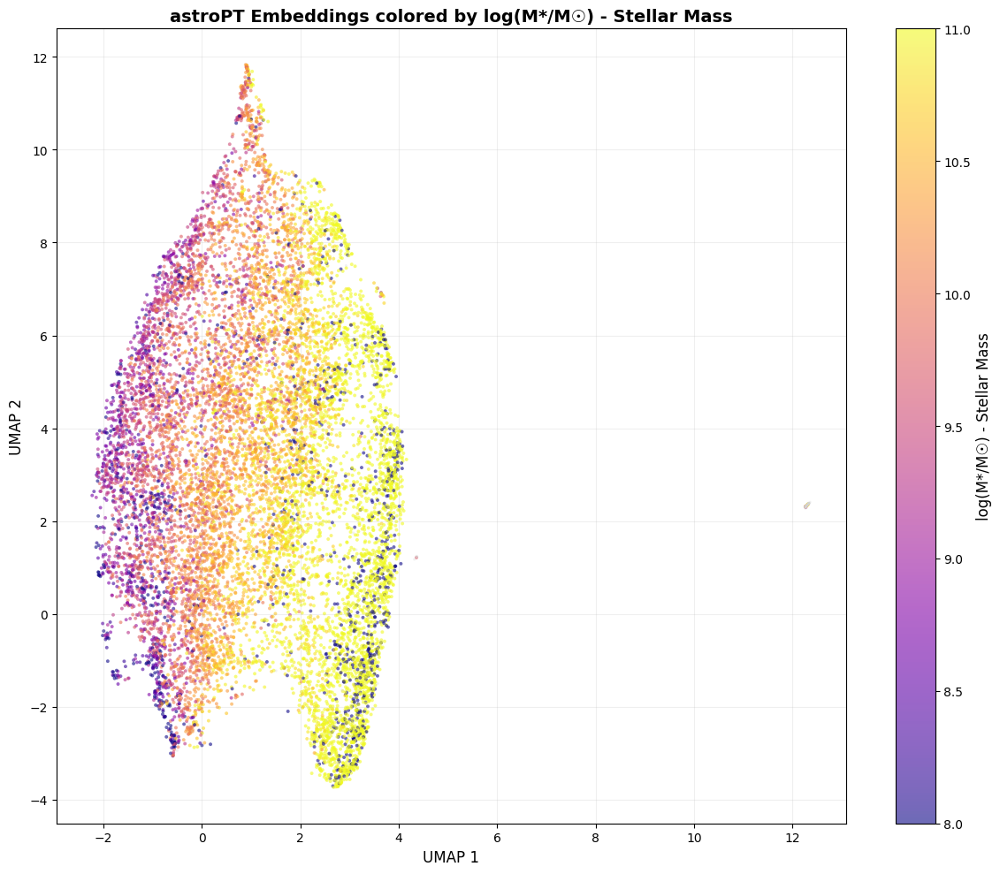

Saved: astropt_embeddings_logm.png


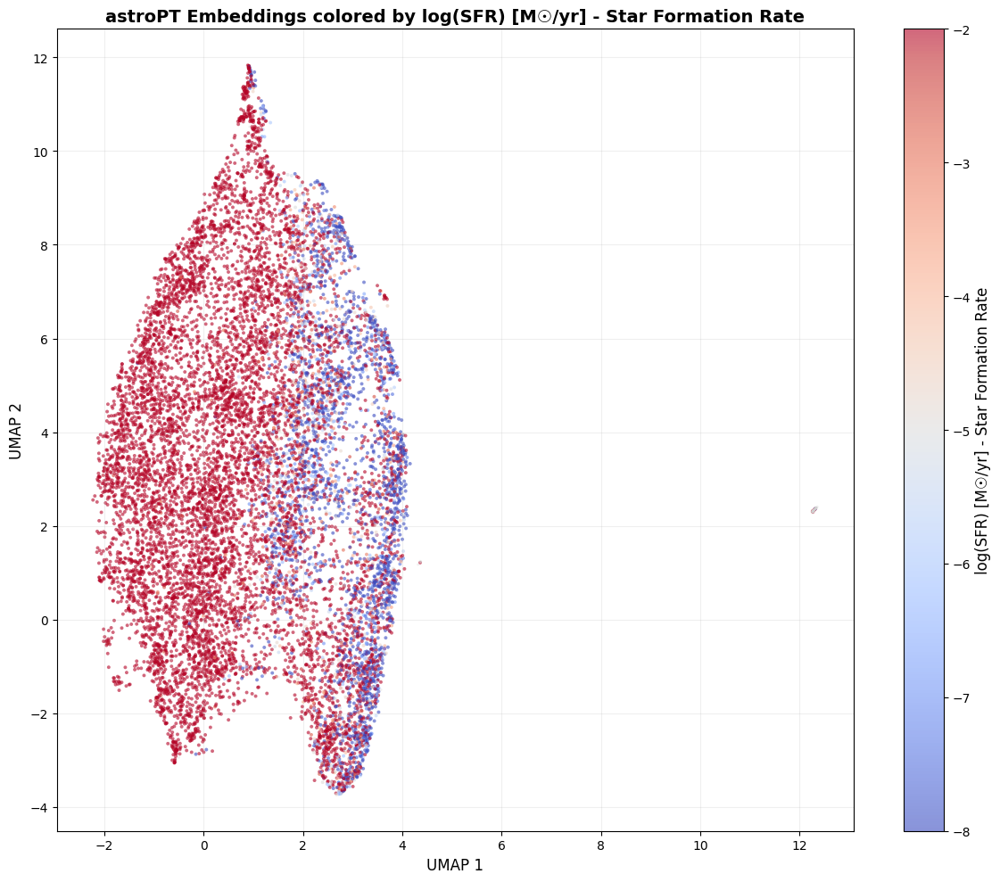

Saved: astropt_embeddings_logsfr.png


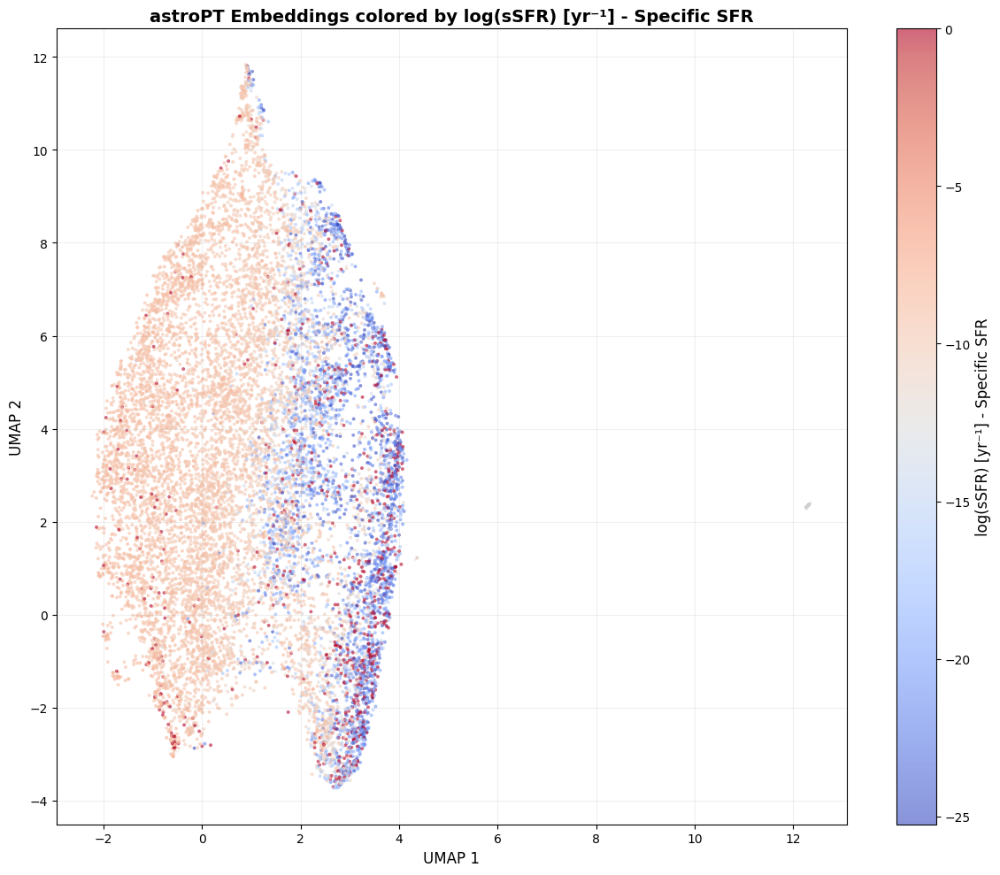

Saved: astropt_embeddings_ssfr.png


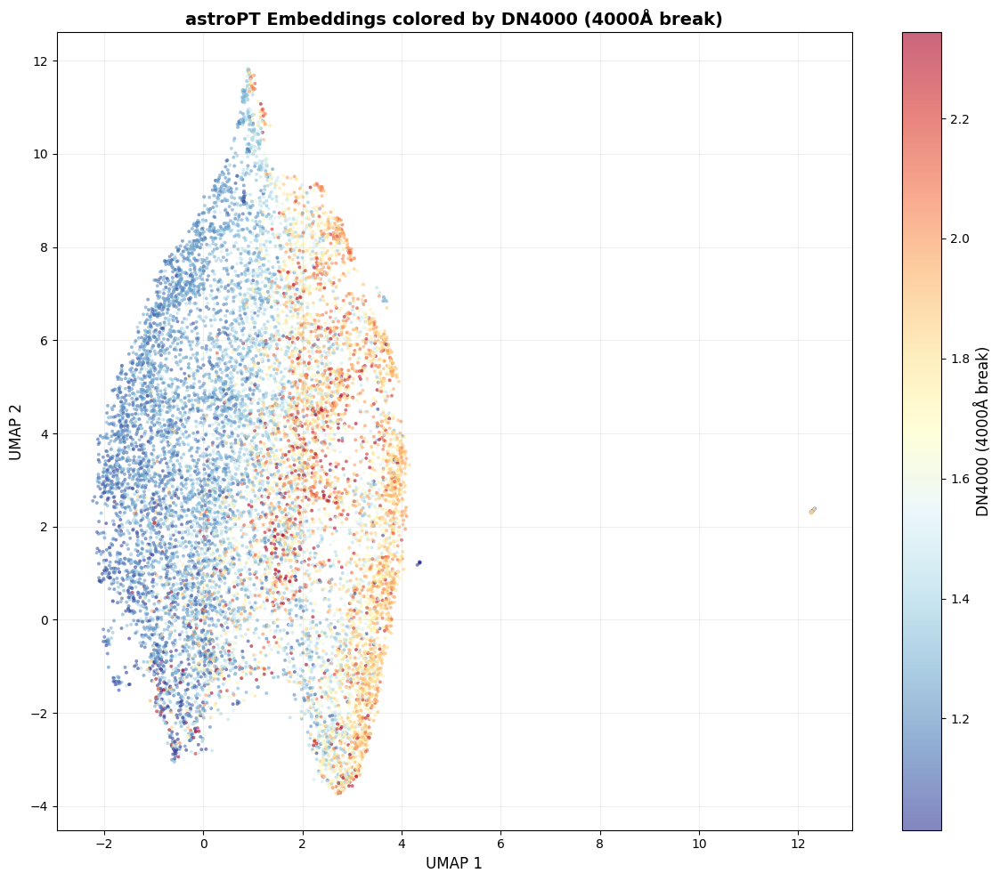

Saved: astropt_embeddings_dn4000.png


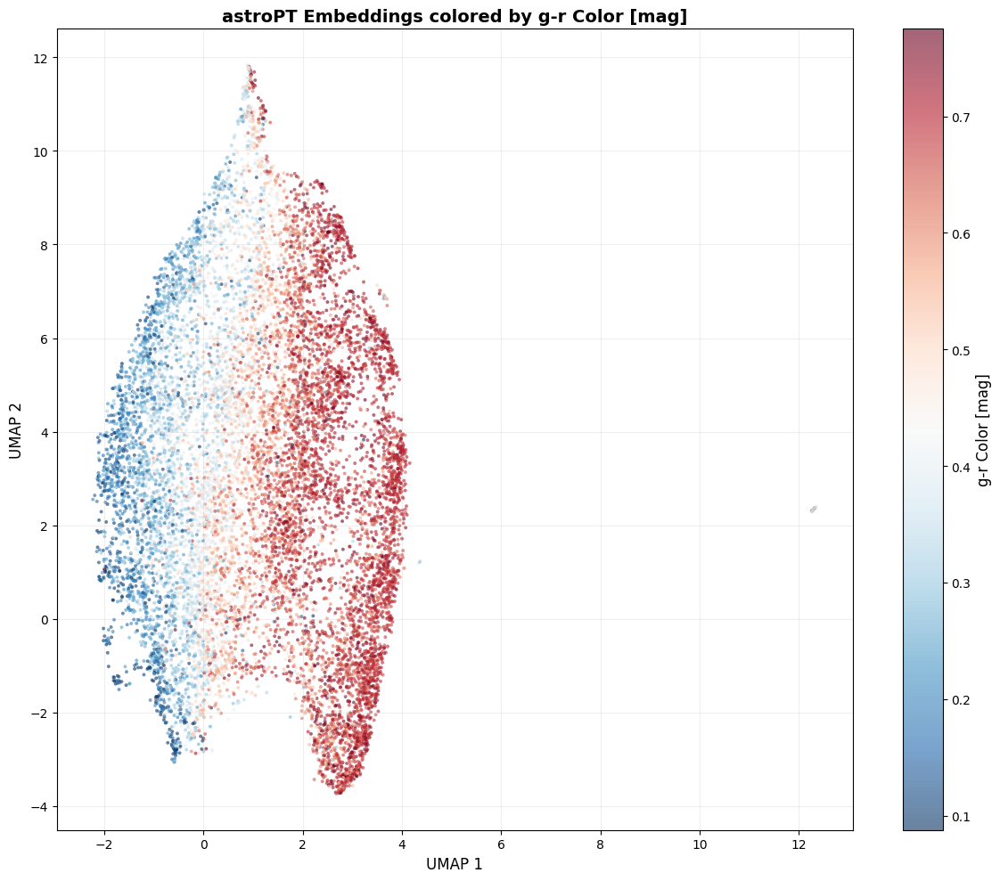

Saved: astropt_embeddings_gr_color.png


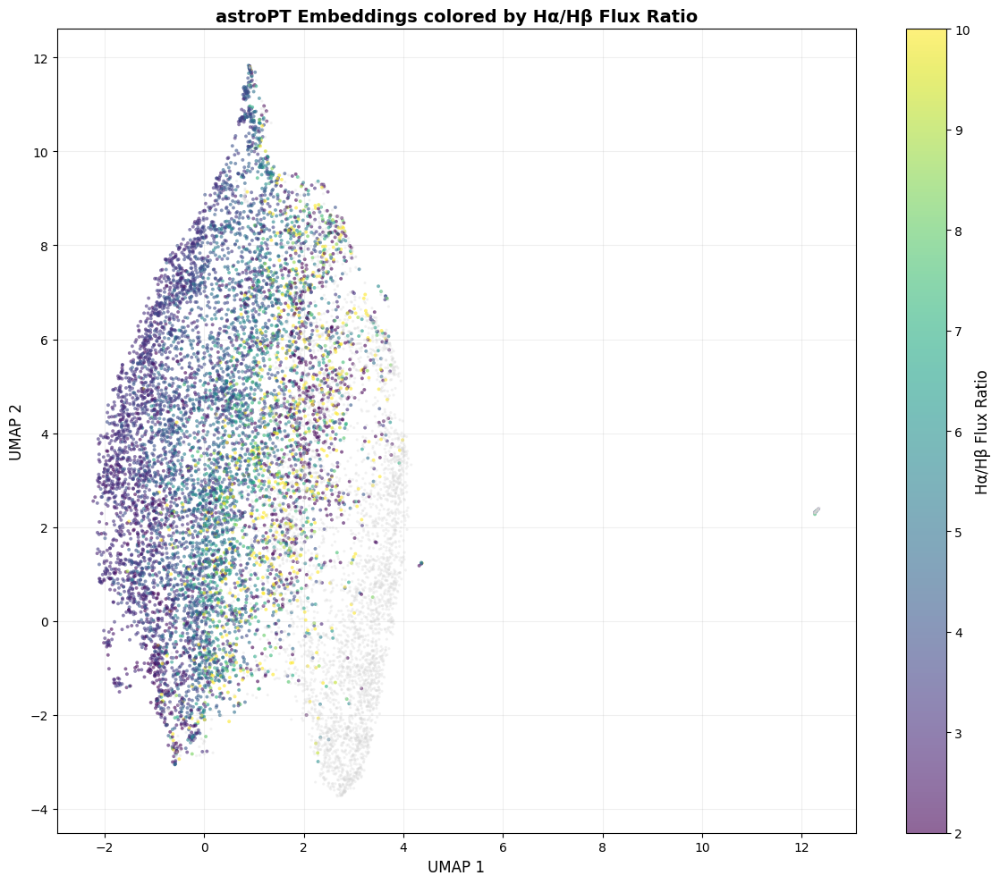

Saved: astropt_embeddings_halpha_hbeta_ratio.png


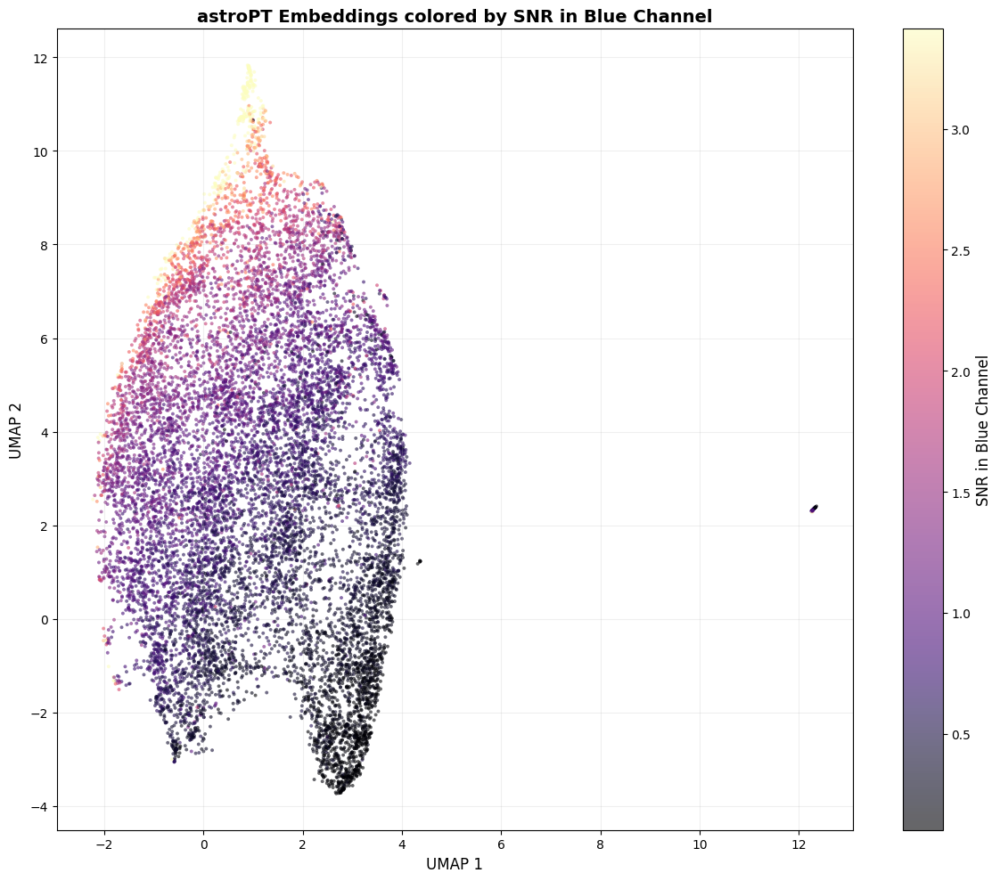

Saved: astropt_embeddings_snr_b.png


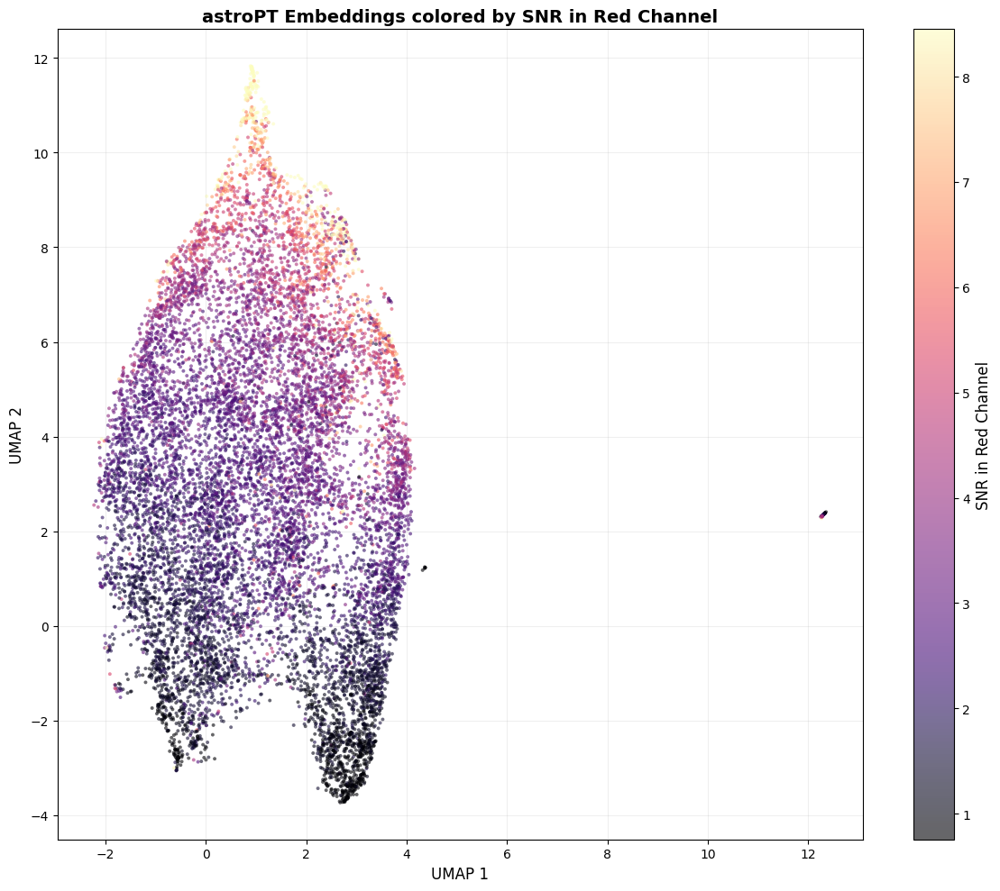

Saved: astropt_embeddings_snr_r.png


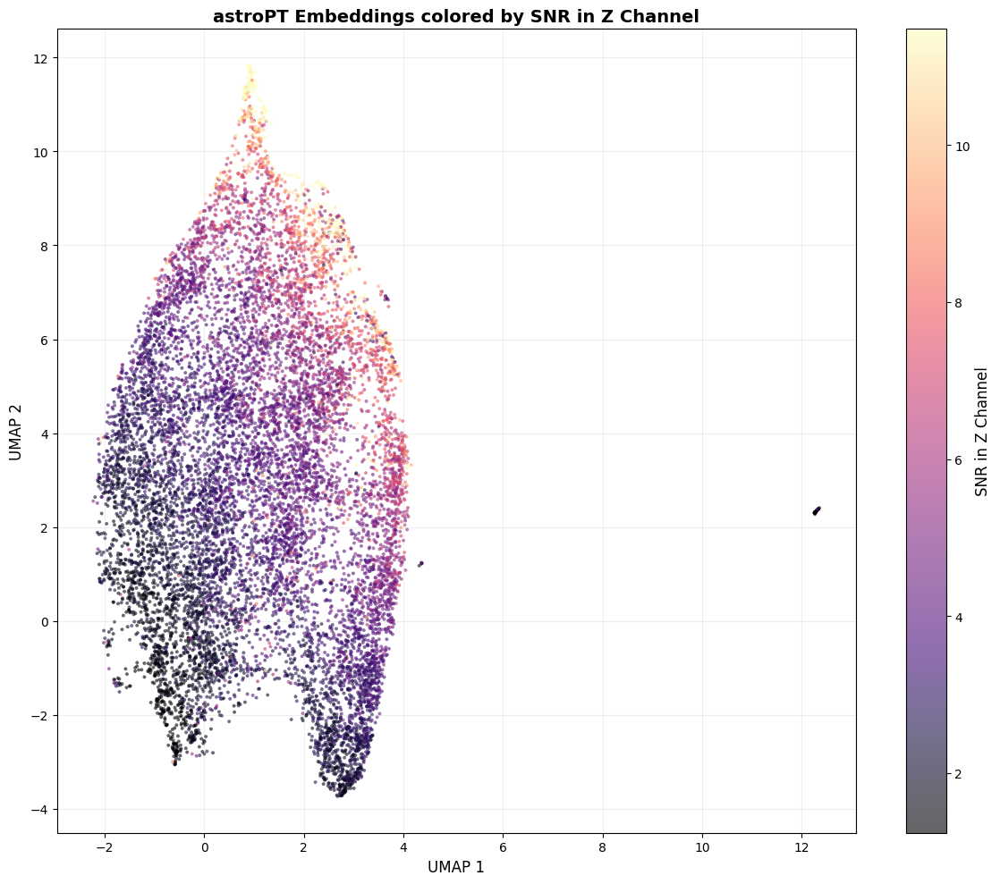

Saved: astropt_embeddings_snr_z.png

MORPHOLOGICAL PROPERTIES VISUALIZATIONS



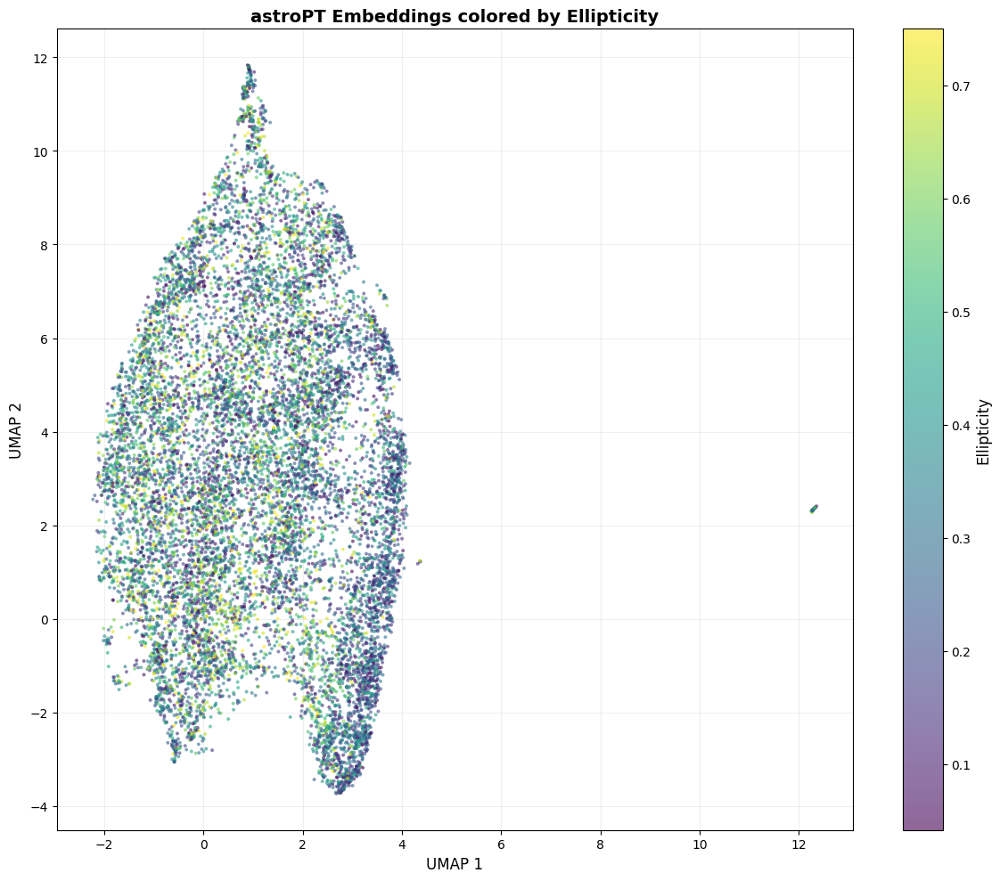

Saved: astropt_embeddings_ellipticity.png


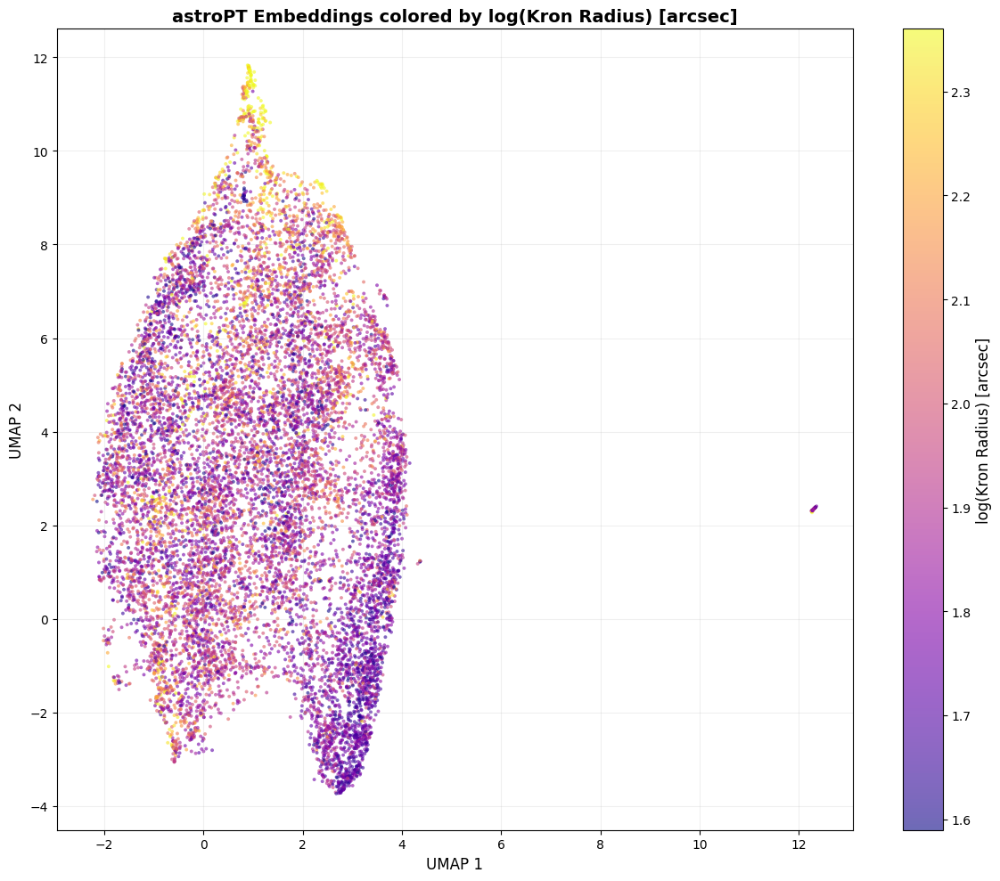

Saved: astropt_embeddings_kron_radius.png


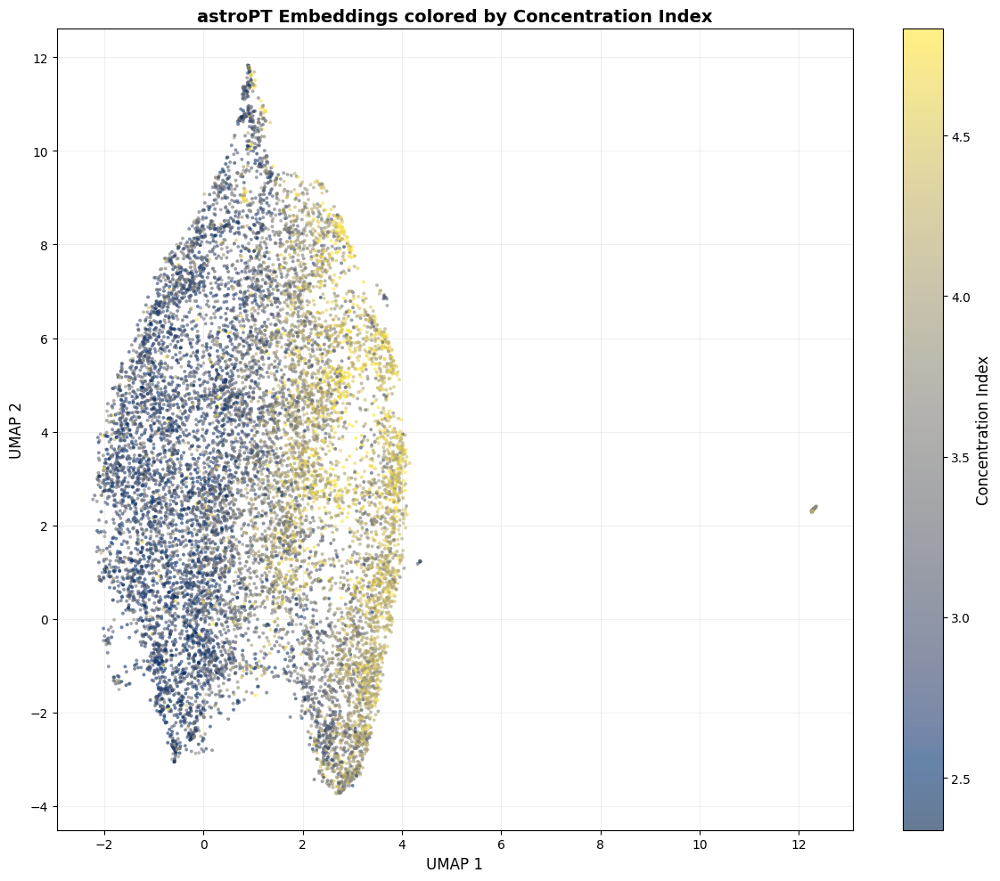

Saved: astropt_embeddings_concentration.png


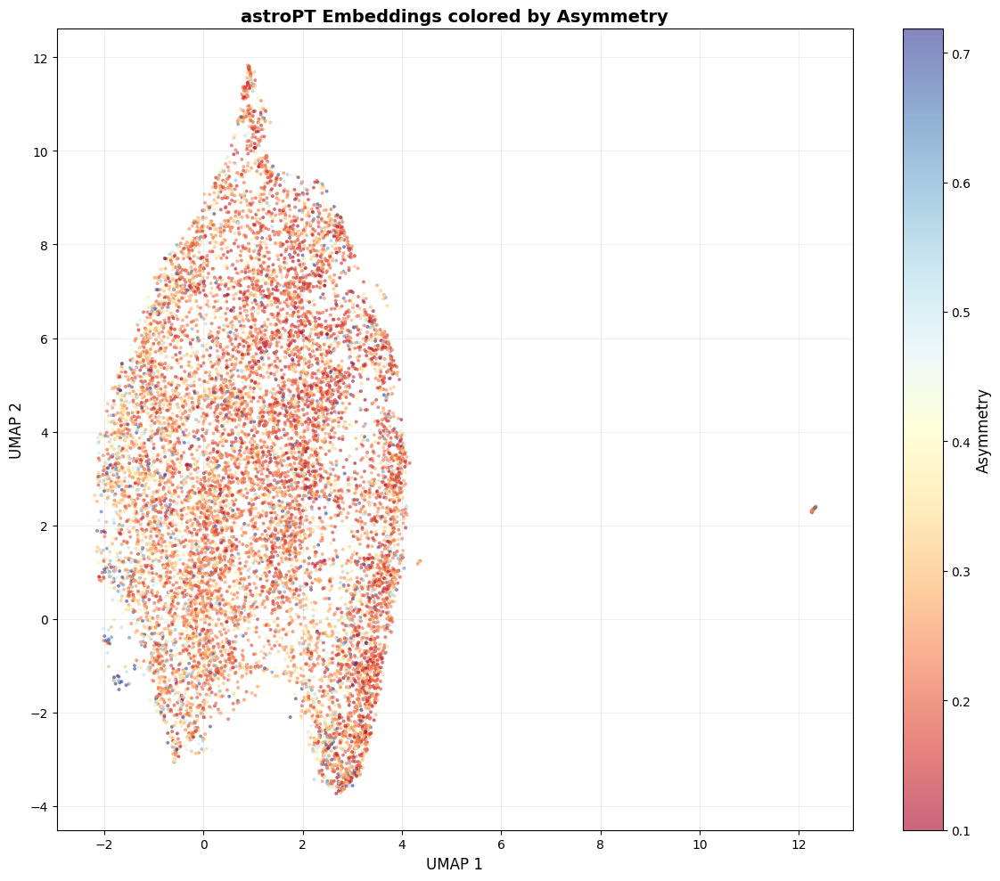

Saved: astropt_embeddings_asymmetry.png


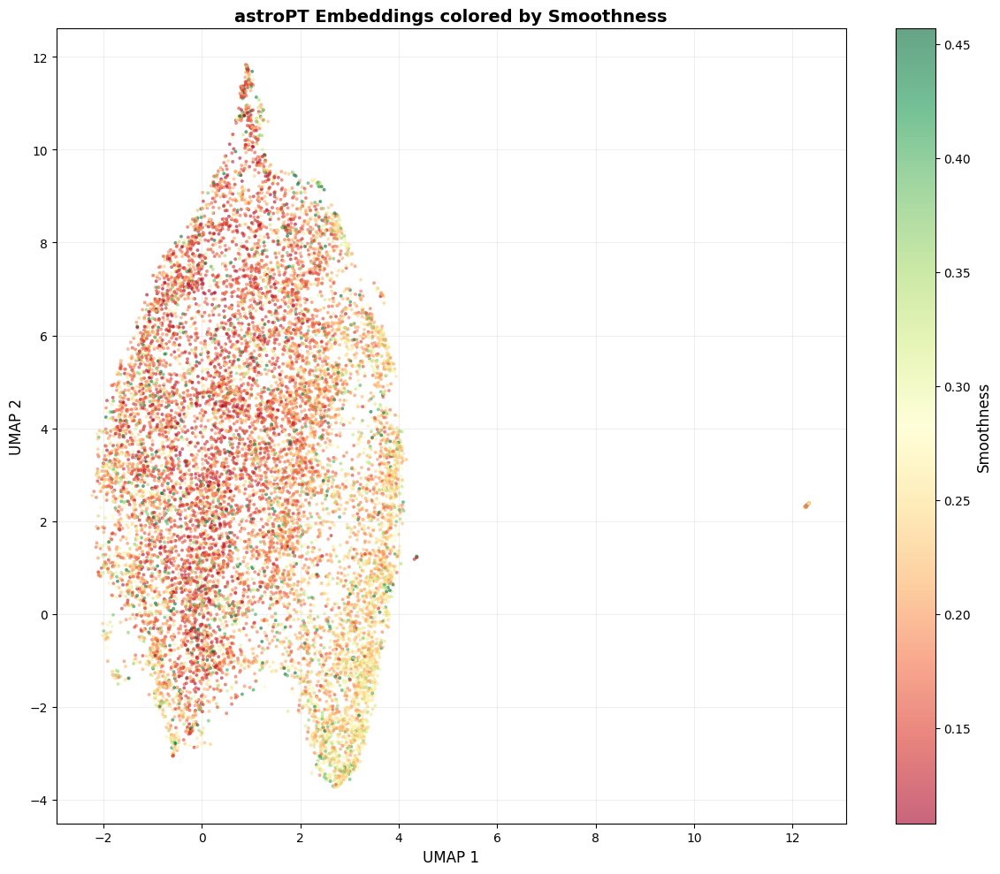

Saved: astropt_embeddings_smoothness.png


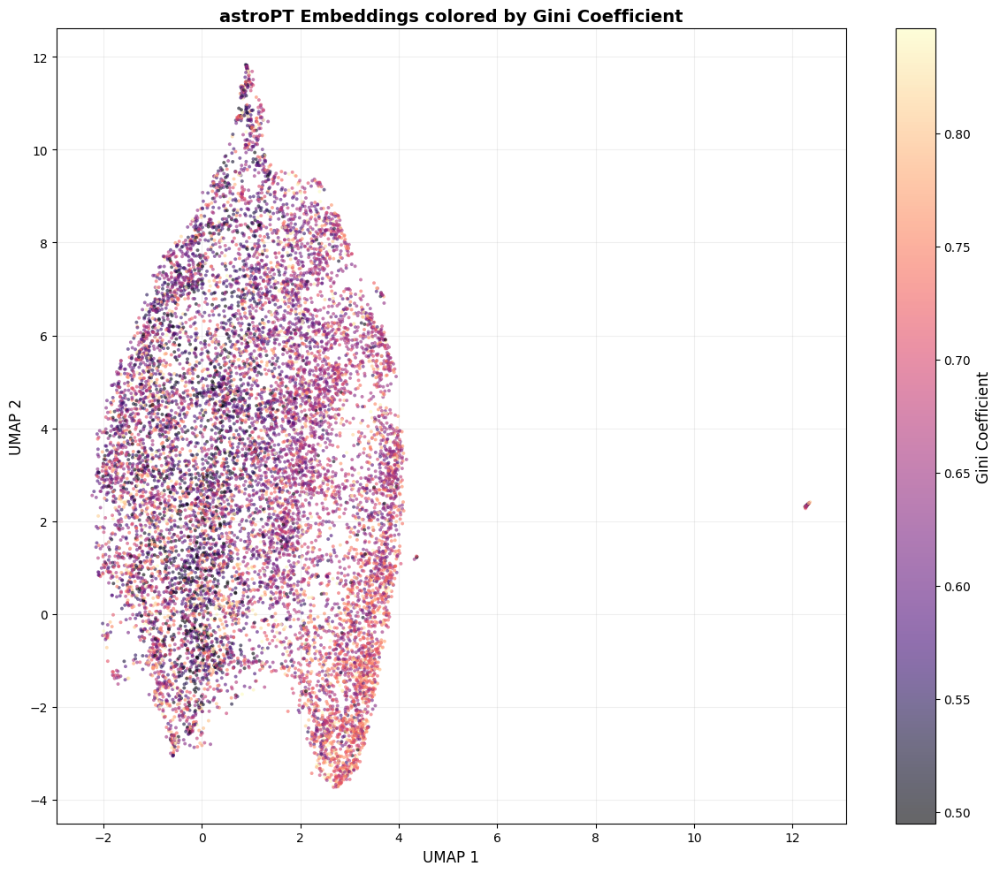

Saved: astropt_embeddings_gini.png


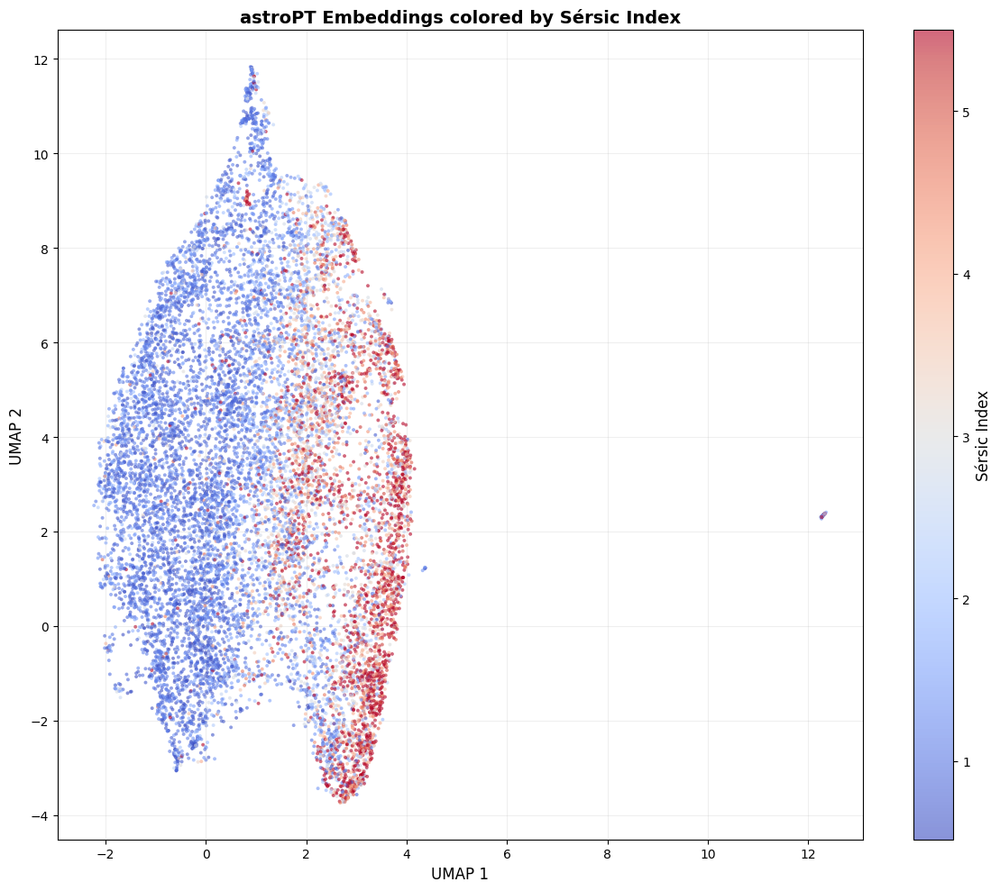

Saved: astropt_embeddings_sersic_index.png


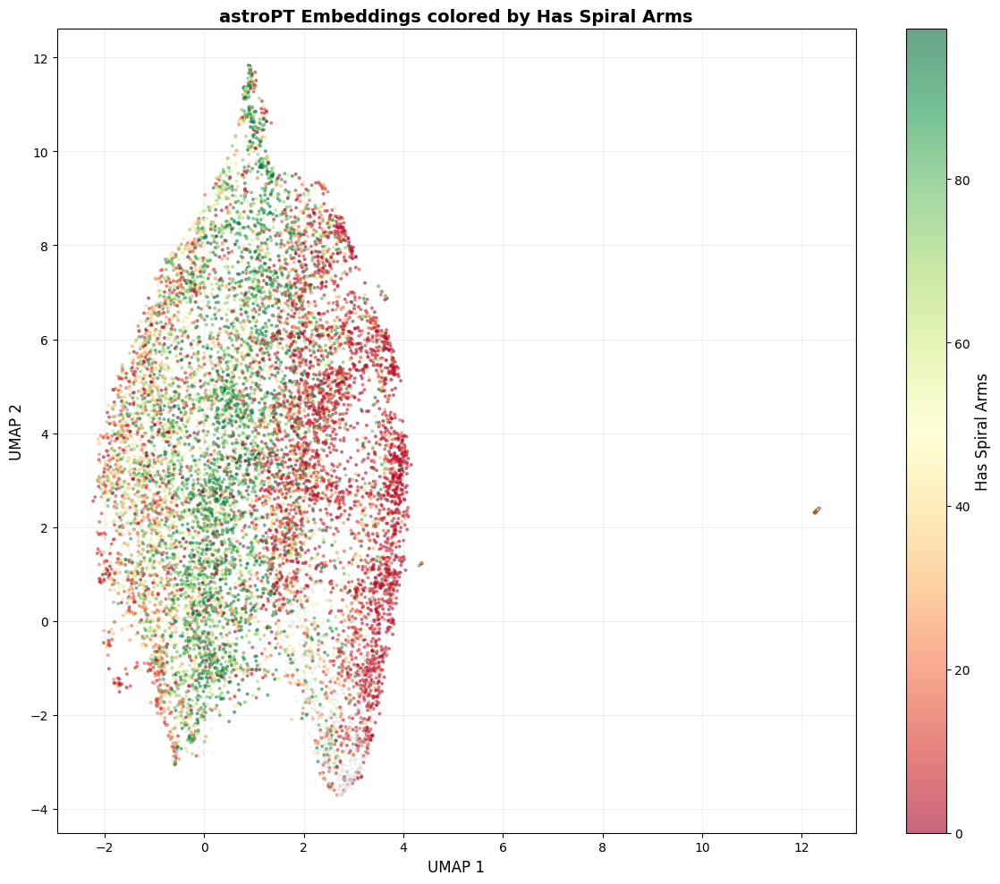

Saved: astropt_embeddings_spiral_arms.png


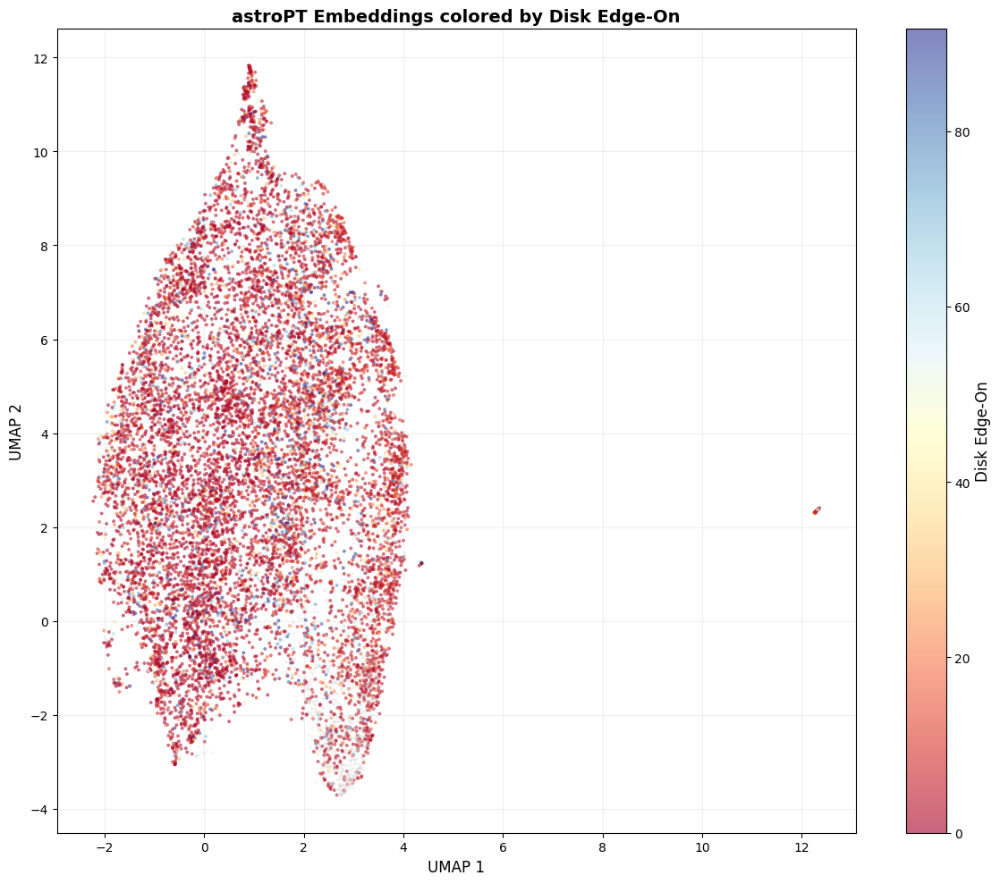

Saved: astropt_embeddings_edge_on.png


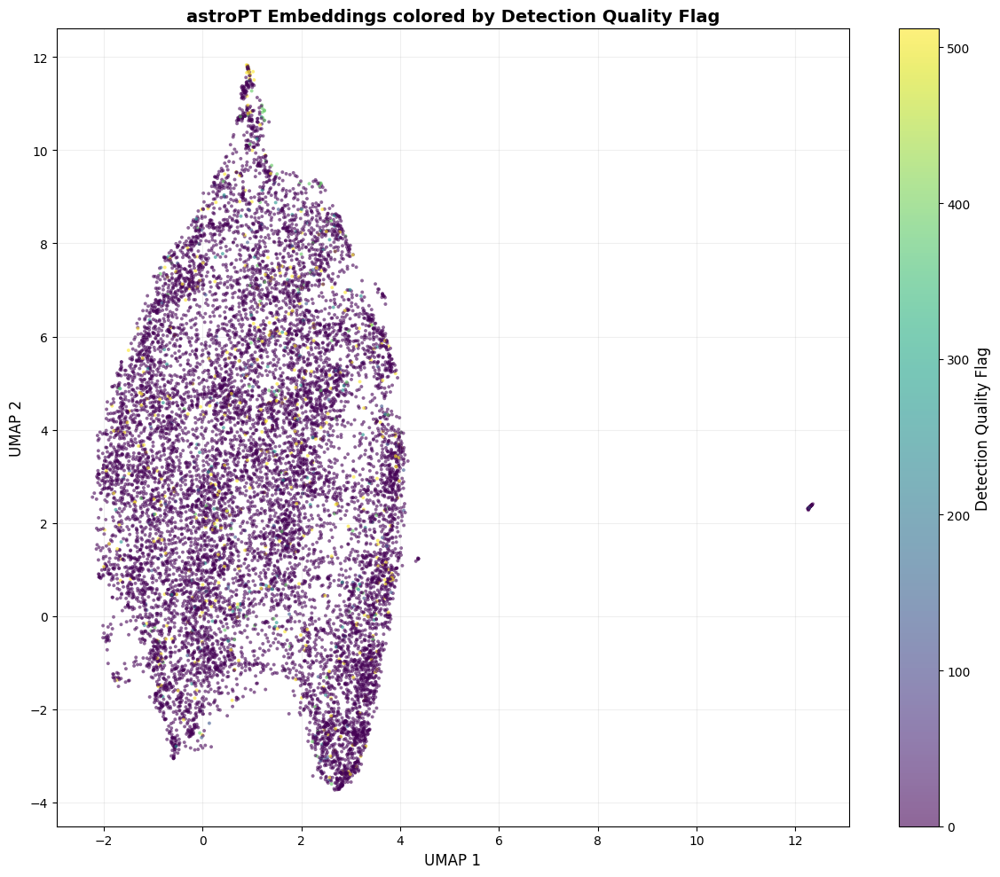

Saved: astropt_embeddings_det_quality.png


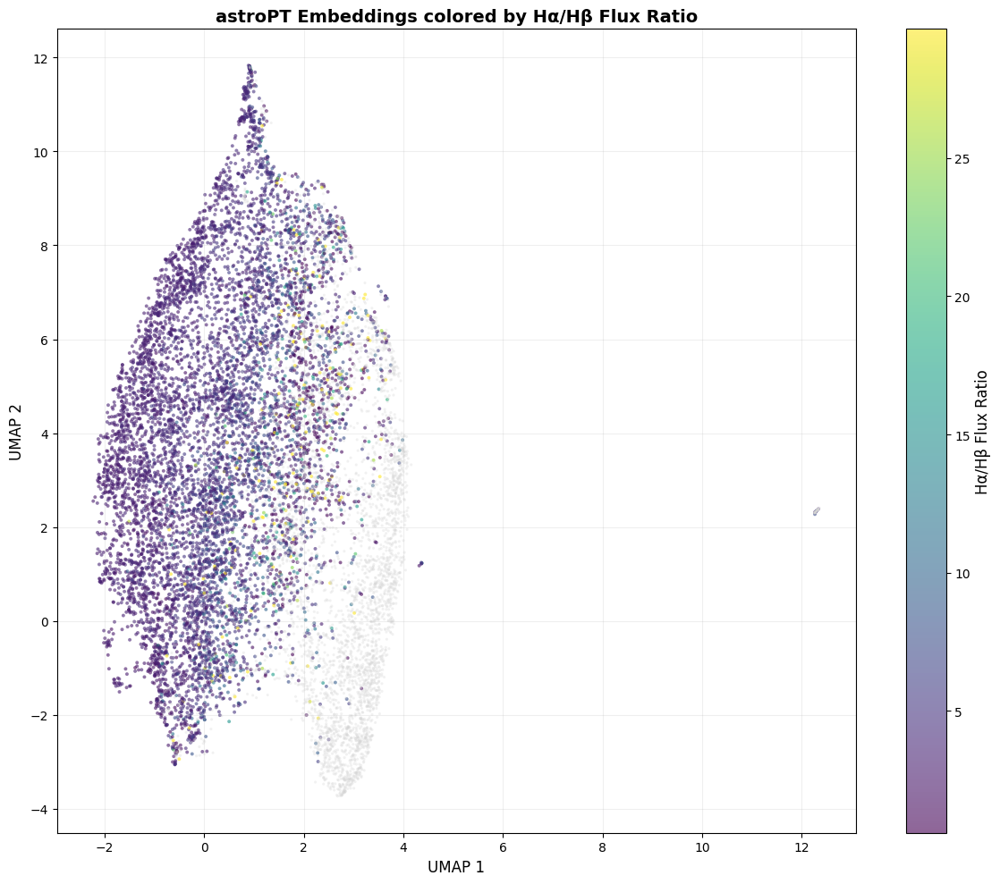

Saved: astropt_embeddings_halpha_hbeta.png


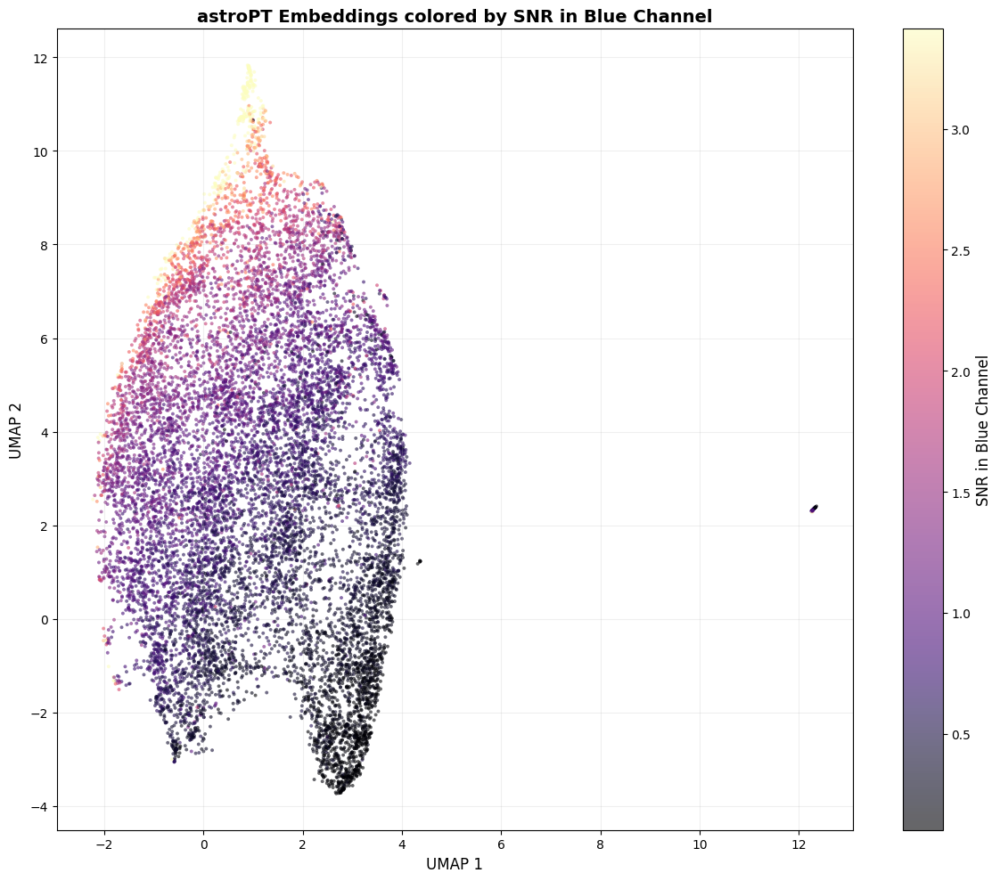

Saved: astropt_embeddings_snr_b.png


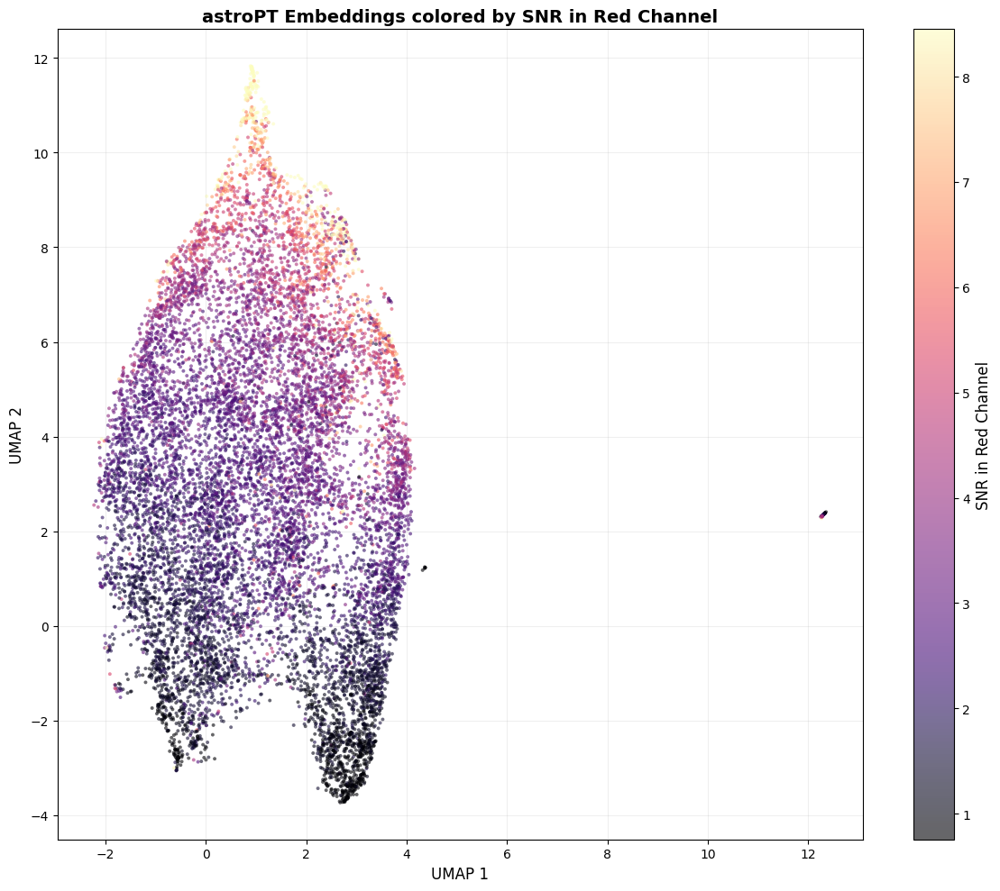

Saved: astropt_embeddings_snr_r.png


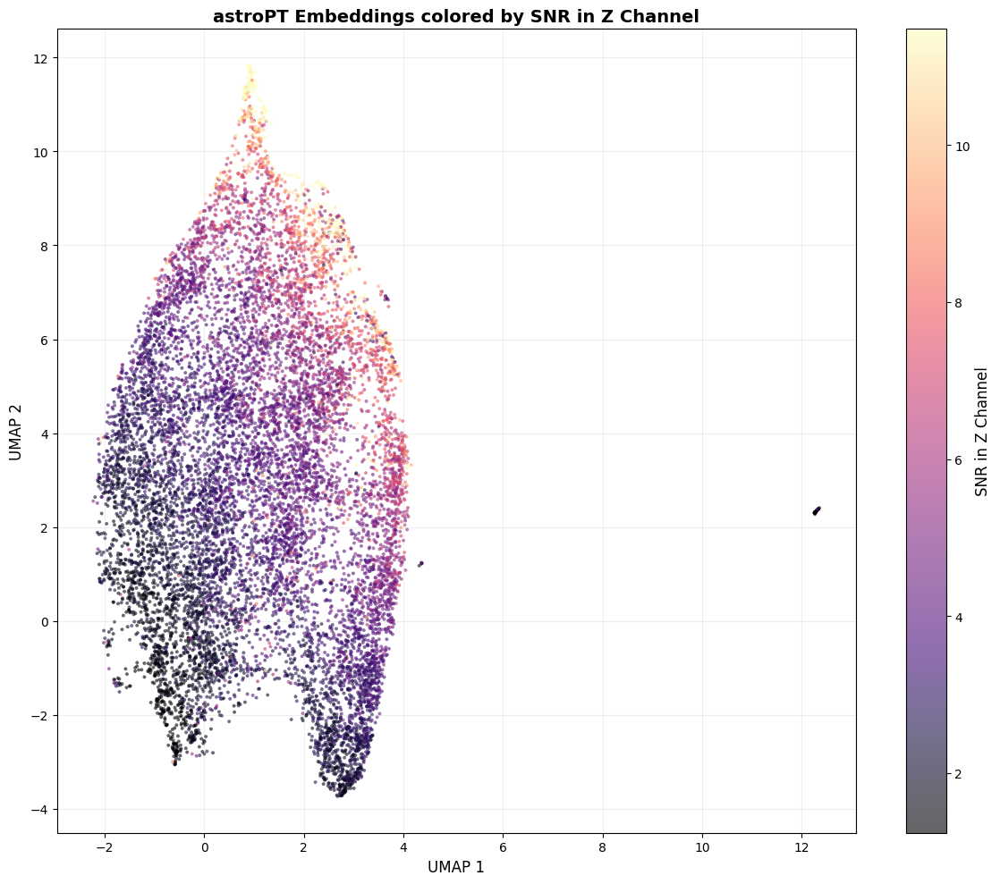

Saved: astropt_embeddings_snr_z.png


In [8]:
def plot_property(property_data, property_name, cmap, output_file, vmin=None, vmax=None):
    """Create visualization for a given property."""
    fig, ax = plt.subplots(figsize=(12, 10))
    
    valid_mask = ~np.isnan(property_data)
    
    if valid_mask.sum() == 0:
        print(f"⚠ No valid data for {property_name}, skipping plot")
        plt.close(fig)
        return
    
    # Use provided vmin/vmax or calculate from data
    if vmin is None:
        vmin = np.nanpercentile(property_data, 2)
    if vmax is None:
        vmax = np.nanpercentile(property_data, 98)
    
    scatter = ax.scatter(
        embeddings_umap[valid_mask, 0],
        embeddings_umap[valid_mask, 1],
        c=property_data[valid_mask],
        cmap=cmap,
        s=8,
        alpha=0.6,
        edgecolors='none',
        vmin=vmin,
        vmax=vmax
    )
    
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label(property_name, fontsize=12)
    
    # Plot invalid in gray
    if (~valid_mask).sum() > 0:
        ax.scatter(
            embeddings_umap[~valid_mask, 0],
            embeddings_umap[~valid_mask, 1],
            s=5,
            color='lightgray',
            alpha=0.3,
            edgecolors='none'
        )
    
    ax.set_xlabel('UMAP 1', fontsize=12)
    ax.set_ylabel('UMAP 2', fontsize=12)
    ax.set_title(f'astroPT Embeddings colored by {property_name}', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.2)
    
    plt.tight_layout()
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {output_file}")

# Plot for different spectral/physical properties
print("\n" + "="*70)
print("SPECTRAL/PHYSICAL PROPERTIES VISUALIZATIONS")
print("="*70 + "\n")

spectral_property_configs = [
    (logm, 'log(M*/M☉) - Stellar Mass', 'plasma', 'astropt_embeddings_logm.png', 8, 11),
    (logsfr, 'log(SFR) [M☉/yr] - Star Formation Rate', 'coolwarm', 'astropt_embeddings_logsfr.png', -8, -2),
    (ssfr, 'log(sSFR) [yr⁻¹] - Specific SFR', 'coolwarm', 'astropt_embeddings_ssfr.png', None, None),
    (dn4000, 'DN4000 (4000Å break)', 'RdYlBu_r', 'astropt_embeddings_dn4000.png', None, None),
    (gr_color, 'g-r Color [mag]', 'RdBu_r', 'astropt_embeddings_gr_color.png', None, None),
    (halpha_hbeta_ratio, 'Hα/Hβ Flux Ratio', 'viridis', 'astropt_embeddings_halpha_hbeta_ratio.png', 2, 10),
    (snr_b, 'SNR in Blue Channel', 'magma', 'astropt_embeddings_snr_b.png', None, None),
    (snr_r, 'SNR in Red Channel', 'magma', 'astropt_embeddings_snr_r.png', None, None),
    (snr_z, 'SNR in Z Channel', 'magma', 'astropt_embeddings_snr_z.png', None, None),
]

for prop_data, prop_name, cmap, output_file, vmin, vmax in spectral_property_configs:
    plot_property(prop_data, prop_name, cmap, output_file, vmin, vmax)

# Plot for morphological properties
print("\n" + "="*70)
print("MORPHOLOGICAL PROPERTIES VISUALIZATIONS")
print("="*70 + "\n")

morphological_property_configs = [
    (ellipticity, 'Ellipticity', 'viridis', 'astropt_embeddings_ellipticity.png', None, None),
    (np.log10(kron_radius), 'log(Kron Radius) [arcsec]', 'plasma', 'astropt_embeddings_kron_radius.png', None, None),
    (concentration, 'Concentration Index', 'cividis', 'astropt_embeddings_concentration.png', None, None),
    (asymmetry, 'Asymmetry', 'RdYlBu', 'astropt_embeddings_asymmetry.png', None, None),
    (smoothness, 'Smoothness', 'RdYlGn', 'astropt_embeddings_smoothness.png', None, None),
    (gini, 'Gini Coefficient', 'magma', 'astropt_embeddings_gini.png', None, None),
    (sersic_index, 'Sérsic Index', 'coolwarm', 'astropt_embeddings_sersic_index.png', None, None),
    (has_spiral_arms, 'Has Spiral Arms', 'RdYlGn', 'astropt_embeddings_spiral_arms.png', None, None),
    (disk_edge_on, 'Disk Edge-On', 'RdYlBu', 'astropt_embeddings_edge_on.png', None, None),
    (det_quality_flag, 'Detection Quality Flag', 'viridis', 'astropt_embeddings_det_quality.png', None, None),
    (halpha_hbeta_ratio, 'Hα/Hβ Flux Ratio', 'viridis', 'astropt_embeddings_halpha_hbeta.png', None, None),
    (snr_b, 'SNR in Blue Channel', 'magma', 'astropt_embeddings_snr_b.png', None, None),
    (snr_r, 'SNR in Red Channel', 'magma', 'astropt_embeddings_snr_r.png', None, None),
    (snr_z, 'SNR in Z Channel', 'magma', 'astropt_embeddings_snr_z.png', None, None),
]

for prop_data, prop_name, cmap, output_file, vmin, vmax in morphological_property_configs:
    plot_property(prop_data, prop_name, cmap, output_file, vmin, vmax)

## 7. Visualize by Spectral Type

Color embeddings by spectral classification (GALAXY, QSO, STAR).

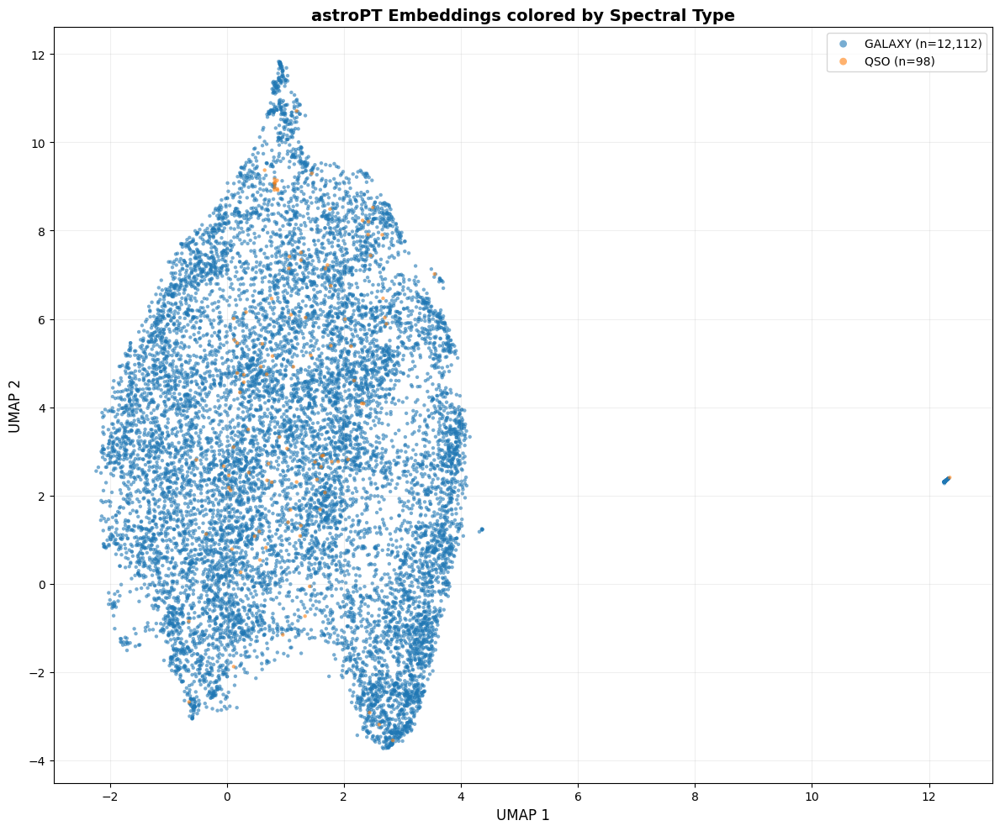

Saved: astropt_embeddings_spectype.png


In [9]:
# Color palette for spectral types
colors_map = {
    'GALAXY': '#1f77b4',  # Blue
    'QSO': '#ff7f0e',     # Orange
    'STAR': '#2ca02c',    # Green
}

fig, ax = plt.subplots(figsize=(12, 10))

valid_mask = spectype != ''
unique_types = np.unique(spectype[valid_mask])

# Plot each spectral type
for stype in unique_types:
    mask = (spectype == stype)
    if mask.sum() > 0:
        color = colors_map.get(stype, '#d62728')
        ax.scatter(
            embeddings_umap[mask, 0],
            embeddings_umap[mask, 1],
            c=color,
            label=f'{stype} (n={mask.sum():,})',
            s=10,
            alpha=0.6,
            edgecolors='none'
        )

# Plot unknown
if (~valid_mask).sum() > 0:
    ax.scatter(
        embeddings_umap[~valid_mask, 0],
        embeddings_umap[~valid_mask, 1],
        c='lightgray',
        label=f'Unknown (n={(~valid_mask).sum():,})',
        s=6,
        alpha=0.3,
        edgecolors='none'
    )

ax.set_xlabel('UMAP 1', fontsize=12)
ax.set_ylabel('UMAP 2', fontsize=12)
ax.set_title('astroPT Embeddings colored by Spectral Type', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=10, markerscale=2)
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig('astropt_embeddings_spectype.png', dpi=300, bbox_inches='tight')
plt.show()

print("Saved: astropt_embeddings_spectype.png")

## 8. Correlation Analysis

Compute correlations between UMAP dimensions and physical properties.

In [10]:
print(f"\n{'='*70}")
print(f"CORRELATION ANALYSIS: astroPT Multimodal Embeddings")
print(f"{'='*70}")

properties_dict = {
    'Redshift': redshifts,
    'LOGM (Stellar Mass)': logm,
    'LOGSFR (SFR)': logsfr,
    'sSFR': ssfr,
    'DN4000 (Age)': dn4000,
    'g-r Color': gr_color,
    'Ellipticity': ellipticity,
    'log(Kron Radius)': np.log10(kron_radius),
    'Concentration': concentration,
    'Asymmetry': asymmetry,
    'Smoothness': smoothness,
    'Gini': gini,
    'Sérsic Index': sersic_index,
    'Has Spiral Arms': has_spiral_arms,
    'Disk Edge-On': disk_edge_on,
    'Det Quality Flag': det_quality_flag,
}

print(f"\n{'Property':<25} {'UMAP-1':>10} {'UMAP-2':>10} {'p-val 1':>10} {'p-val 2':>10}")
print("-" * 70)

for prop_name, prop_data in properties_dict.items():
    valid_mask = ~np.isnan(prop_data)
    if valid_mask.sum() > 100:
        corr1, pval1 = spearmanr(embeddings_umap[valid_mask, 0], prop_data[valid_mask])
        corr2, pval2 = spearmanr(embeddings_umap[valid_mask, 1], prop_data[valid_mask])
        sig1 = "***" if pval1 < 0.001 else "**" if pval1 < 0.01 else "*" if pval1 < 0.05 else ""
        sig2 = "***" if pval2 < 0.001 else "**" if pval2 < 0.01 else "*" if pval2 < 0.05 else ""
        print(f"{prop_name:<25} {corr1:>9.3f}{sig1} {corr2:>9.3f}{sig2} {pval1:>10.3e} {pval2:>10.3e}")
    else:
        print(f"{prop_name:<25} {'N/A':>10} {'N/A':>10} {'N/A':>10} {'N/A':>10}")

print("\n" + "="*70)
print("Significance: *** p<0.001, ** p<0.01, * p<0.05")
print("="*70)


CORRELATION ANALYSIS: astroPT Multimodal Embeddings

Property                      UMAP-1     UMAP-2    p-val 1    p-val 2
----------------------------------------------------------------------
Redshift                      0.645***    -0.472***  0.000e+00  0.000e+00
LOGM (Stellar Mass)           0.663***    -0.138***  0.000e+00  8.637e-53
LOGSFR (SFR)                 -0.437***     0.011  0.000e+00  2.444e-01
sSFR                         -0.590***     0.001  0.000e+00  9.068e-01
DN4000 (Age)                  0.684***    -0.080***  0.000e+00  7.377e-19
g-r Color                     0.838***    -0.102***  0.000e+00  2.494e-29
Ellipticity                  -0.134***     0.012  4.988e-50  1.952e-01
log(Kron Radius)             -0.125***     0.241***  1.296e-43 3.359e-160
Concentration                 0.658***     0.029**  0.000e+00  1.316e-03
Asymmetry                    -0.147***    -0.094***  1.081e-59  2.422e-25
Smoothness                    0.243***    -0.226*** 1.905e-163 1.430e-141
G

## 9. Summary

Key findings from the astroPT multimodal embeddings analysis.

In [11]:
print("="*70)
print("astroPT MULTIMODAL EMBEDDINGS ANALYSIS SUMMARY")
print("="*70)
print(f"\nTotal objects analyzed: {len(embeddings)}")
print(f"Embedding dimension: {embeddings.shape[1]}")

print(f"\nCatalog matching:")
print(f"  • Matched objects: {(matched_indices >= 0).sum()} ({match_rate:.1f}%)")
print(f"  • Valid redshifts: {(~np.isnan(redshifts)).sum()}")
if (~np.isnan(redshifts)).sum() > 0:
    print(f"  • Redshift range: [{np.nanmin(redshifts):.3f}, {np.nanmax(redshifts):.3f}]")

print(f"\nModel checkpoint:")
print(f"  • /pbs/home/a/astroinfo09/logs/logs/astropt_multimodal_full_20251106_011934/ckpt_iter_21000.pt")

print("\n" + "="*70)
print("✓ Analysis complete! Figures saved to current directory.")
print("="*70)

print("\n Generated files:")
print("  Spectral/Physical properties:")
print("    • astropt_embeddings_redshift.png")
print("    • astropt_embeddings_logm.png")
print("    • astropt_embeddings_logsfr.png")
print("    • astropt_embeddings_ssfr.png")
print("    • astropt_embeddings_dn4000.png")
print("    • astropt_embeddings_gr_color.png")
print("    • astropt_embeddings_spectype.png")
print("  Morphological properties:")
print("    • astropt_embeddings_ellipticity.png")
print("    • astropt_embeddings_kron_radius.png")
print("    • astropt_embeddings_concentration.png")
print("    • astropt_embeddings_asymmetry.png")
print("    • astropt_embeddings_smoothness.png")
print("    • astropt_embeddings_gini.png")
print("    • astropt_embeddings_sersic_index.png")
print("    • astropt_embeddings_spiral_arms.png")
print("    • astropt_embeddings_edge_on.png")
print("    • astropt_embeddings_det_quality.png")

astroPT MULTIMODAL EMBEDDINGS ANALYSIS SUMMARY

Total objects analyzed: 12210
Embedding dimension: 768

Catalog matching:
  • Matched objects: 12210 (100.0%)
  • Valid redshifts: 12210
  • Redshift range: [0.009, 1.797]

Model checkpoint:
  • /pbs/home/a/astroinfo09/logs/logs/astropt_multimodal_full_20251106_011934/ckpt_iter_21000.pt

✓ Analysis complete! Figures saved to current directory.

 Generated files:
  Spectral/Physical properties:
    • astropt_embeddings_redshift.png
    • astropt_embeddings_logm.png
    • astropt_embeddings_logsfr.png
    • astropt_embeddings_ssfr.png
    • astropt_embeddings_dn4000.png
    • astropt_embeddings_gr_color.png
    • astropt_embeddings_spectype.png
  Morphological properties:
    • astropt_embeddings_ellipticity.png
    • astropt_embeddings_kron_radius.png
    • astropt_embeddings_concentration.png
    • astropt_embeddings_asymmetry.png
    • astropt_embeddings_smoothness.png
    • astropt_embeddings_gini.png
    • astropt_embeddings_sersic_ind